# **Grupo de Estudos - Visão Computacional - Semana 2**

### **Objetivo**
Nesta segunda semana do grupo de estudos de visão computacional, estudamos de forma mais aprofundada o conceito de imagens digitais, suas propriedades e características. Também foi apresentado conceitos de espaço de cores e formatos de imagem. Analisamos também os formatos de imagens mais comuns e seus métodos de compressão.

### **Extração de Metadados**

In [ ]:
from PIL import Image
from PIL.ExifTags import TAGS

# Carregue a imagem
image_path = 'imagem.jpg'
image = Image.open(image_path)

# Extraia os dados EXIF da imagem
exif_data = image._getexif()

# Converta os dados EXIF em um dicionário
exif_info = {}
if exif_data:
    for tag, value in exif_data.items():
        tag_name = TAGS.get(tag, tag)
        exif_info[tag_name] = value

exif_info

{'ImageWidth': 8000,
 'ImageLength': 6000,
 'BitsPerSample': (8, 8, 8),
 'GPSInfo': {0: b'\x02\x03\x00\x00',
  1: 'S',
  2: (16.0, 39.0, 56.3423),
  3: 'W',
  4: (49.0, 15.0, 17.4592),
  5: b'\x00',
  6: 787.94},
 'ResolutionUnit': 2,
 'ExifOffset': 332,
 'ImageDescription': 'default',
 'Make': 'DJI',
 'Model': 'MAVIC2-ENTERPRISE-ADVANCED',
 'Software': '10.00.03.12',
 'Orientation': 1,
 'YCbCrPositioning': 1,
 'DateTime': '2023:10:16 10:37:22',
 'SamplesPerPixel': 3,
 'XResolution': 72.0,
 'YResolution': 72.0,
 'XPComment': b'0\x00.\x009\x00.\x001\x004\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00

### **Imagem RBG para monocromática**

In [ ]:
from PIL import Image

# Carregue a imagem
image_path = 'imagem.jpg'
image = Image.open(image_path)

# Converta a imagem em monocromática
monochromatic_image = image.convert('1')  # modo '1' é para imagem com 1-bit de profundidade de cor (preto e branco)

# Salve a imagem monocromática
monochromatic_image_path = 'monocromatic_image.png'
monochromatic_image.save(monochromatic_image_path)

### **Imagem RGB para escala de cinza**

In [ ]:
from PIL import Image

# Carregue a imagem
image_path = 'imagem.jpg'
image = Image.open(image_path)

# Converta a imagem em escala de cinza
grayscale_image = image.convert('L')  # modo 'L' é para imagem com 8-bit de profundidade de cor (escala de cinza)

# Salve a imagem em escala de cinza
grayscale_image_path = 'grayscale_image.png'
grayscale_image.save(grayscale_image_path)

### **Imagem: brilho, azul e vermelho**

In [ ]:
from PIL import Image
import cv2
import numpy as np

# Carregar a imagem em formato RGB
image_path = 'image.jpg'
rgb_image = Image.open(image_path)
rgb_image = np.array(rgb_image)

# Converter a imagem RGB para YCbCr usando OpenCV
ycbcr_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2YCrCb)

# Dividir os canais Y, Cb e Cr
Y, Cb, Cr = cv2.split(ycbcr_image)

# Salvar cada canal como uma imagem em escala de cinza
cv2.imwrite("canal_Y.jpg", Y)
cv2.imwrite("canal_Cb.jpg", Cb)
cv2.imwrite("canal_Cr.jpg", Cr)

# Salvar a imagem original em YCbCr para referência
cv2.imwrite("imagem_YCbCr.jpg", ycbcr_image)

### **Imagem: obtendo o domínio de frequência**

In [ ]:
import cv2
import numpy as np
from scipy.fftpack import dct

# Carregue a imagem em escala de cinza
image_path = 'image.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Função para aplicar a DCT em blocos 8x8
def block_dct(block):
    return dct(dct(block.T, norm='ortho').T, norm='ortho')

# Dividir a imagem em blocos 8x8 e aplicar a DCT em cada bloco
height, width = image.shape
dct_image = np.zeros((height, width), dtype=np.float32)

for i in range(0, height, 8):
    for j in range(0, width, 8):
        block = image[i:i+8, j:j+8]
        if block.shape == (8, 8):  # Verificar se o bloco é 8x8
            dct_image[i:i+8, j:j+8] = block_dct(block)

# Normalizar e salvar a imagem no domínio de frequência para visualização
dct_image_normalized = np.clip(dct_image, 0, 255).astype(np.uint8)
cv2.imwrite("image_domain_frequency.jpg", dct_image_normalized)

### **Imagem: cálculo da compressão**

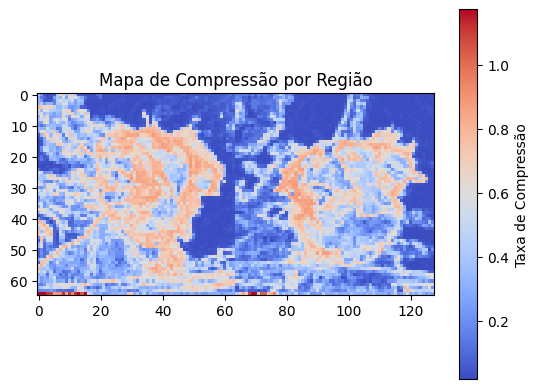

In [ ]:
from PIL import Image
import zlib
import numpy as np
import matplotlib.pyplot as plt

def calculate_compression_ratio(image, block_size=16):
    """
    Divide a imagem em blocos e calcula a relação de compressão para cada bloco.
    Args:
    - image: imagem PNG carregada como objeto PIL.
    - block_size: tamanho do bloco para dividir a imagem em sub-regiões.

    Retorna uma matriz com as proporções de compressão de cada bloco.
    """
    width, height = image.size
    # Calcula o número de blocos horizontal e verticalmente
    num_blocks_x = (width + block_size - 1) // block_size
    num_blocks_y = (height + block_size - 1) // block_size
    compressed_ratios = np.zeros((num_blocks_y, num_blocks_x))

    for i in range(num_blocks_y):
        for j in range(num_blocks_x):
            # Define a área do bloco, considerando bordas da imagem
            left = j * block_size
            upper = i * block_size
            right = min(left + block_size, width)
            lower = min(upper + block_size, height)
            box = (left, upper, right, lower)

            # Recorta o bloco da imagem
            block = image.crop(box)
            block_data = block.tobytes()

            # Calcula a compressão usando zlib
            original_size = len(block_data)
            compressed_data = zlib.compress(block_data)
            compressed_size = len(compressed_data)

            # Proporção de compressão
            ratio = compressed_size / original_size if original_size > 0 else 1
            compressed_ratios[i, j] = ratio

    return compressed_ratios

def plot_compression_map(compressed_ratios):
    """
    Plota um mapa de calor da relação de compressão para cada bloco da imagem.
    """
    plt.imshow(compressed_ratios, cmap='coolwarm', interpolation='nearest')
    plt.colorbar(label='Taxa de Compressão')
    plt.title('Mapa de Compressão por Região')
    plt.show()

# Carregar a imagem PNG
image_path = 'converted_image.png'  # Insira o caminho da sua imagem PNG
image = Image.open(image_path).convert('RGBA')

# Calcula a compressão por região
block_size = 16  # Tamanho do bloco em pixels
compressed_ratios = calculate_compression_ratio(image, block_size)

# Exibe o mapa de calor de compressão
plot_compression_map(compressed_ratios)


### **Imagem: Resize (Redimensionamento)**

Saving imagem_2024-10-31_105239620 (1).png to imagem_2024-10-31_105239620 (1).png


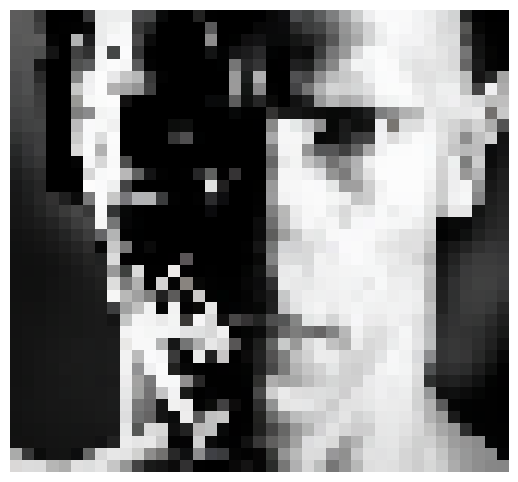

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab import files

# Faça o upload da imagem para o Colab
uploaded = files.upload()

# Carregue a imagem usando o caminho do arquivo (primeiro arquivo carregado)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)

# Função para reduzir a resolução
def reduce_resolution(image, scale=0.005):
    '''Reduz a resolução da imagem dada pela escala escolhida'''
    height, width = image.shape[:2]   # Guarda as duas primeiras dimensões, ignorando a dimensão das cores RGB
    low_res = cv2.resize(image, (int(width * scale), int(height * scale)), interpolation=cv2.INTER_LINEAR)
    return low_res   # Retorna a imagem com resolução reduzida

# Aplicando a função para reduzir a resolução
low_res_image = reduce_resolution(image, scale=0.09)

# Convertendo de BGR para RGB (OpenCV usa BGR)
low_res_image_rgb = cv2.cvtColor(low_res_image, cv2.COLOR_BGR2RGB)

# Visualizando a imagem com matplotlib
plt.figure(figsize=(8, 6))
plt.imshow(low_res_image_rgb)
plt.axis('off')  # Remove os eixos
plt.show()


### **Filtro de Cor**


Canal Azul:


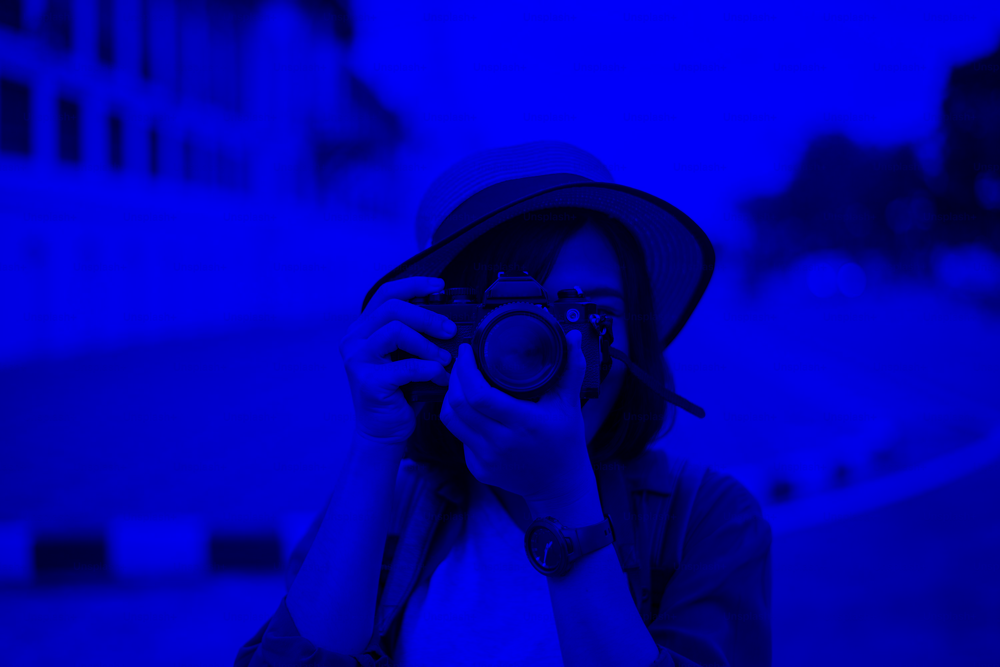

Canal Verde:


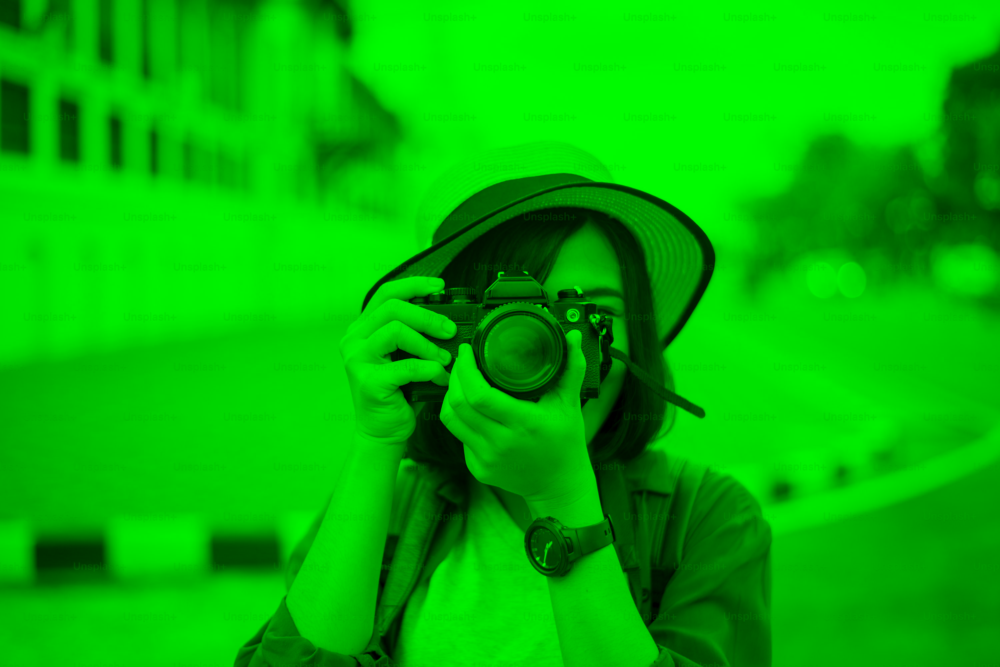

Canal Vermelho:


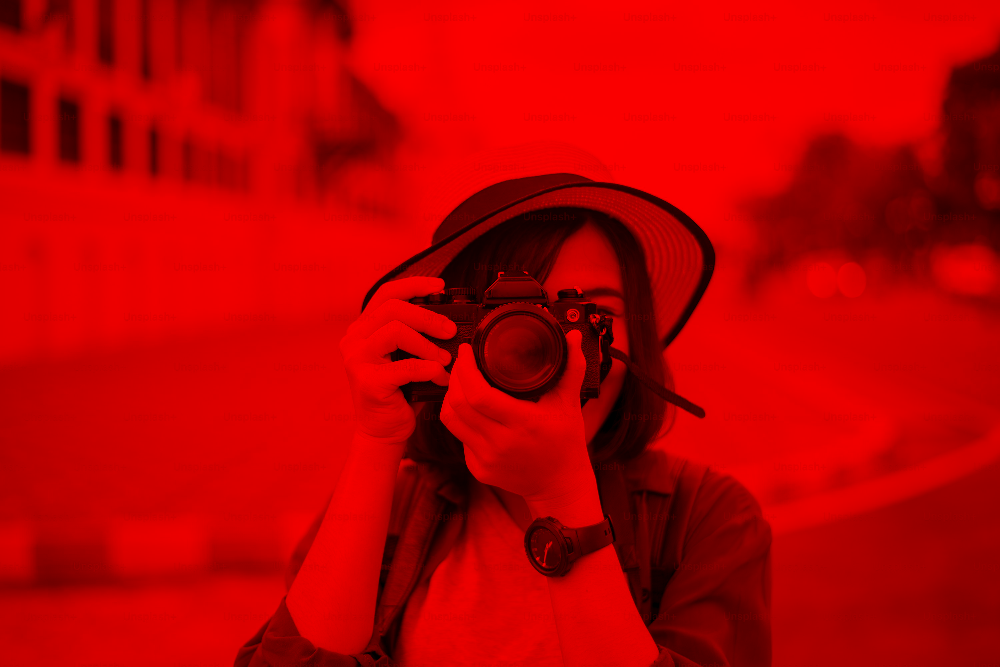

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Carregar a imagem (substitua 'sua_imagem.jpg' pelo caminho da imagem que deseja usar)
image = cv2.imread('image.jpeg')

# Verifique se a imagem foi carregada corretamente
if image is None:
    print("Erro ao carregar a imagem. Verifique o caminho.")
else:
    # Separar os canais de cor (B, G, R)
    b, g, r = cv2.split(image)

    # Criar imagens filtradas para cada cor
    # Azul (B)
    blue_image = np.zeros_like(image)
    blue_image[:, :, 0] = b  # Manter o canal azul, zero nos outros canais

    # Verde (G)
    green_image = np.zeros_like(image)
    green_image[:, :, 1] = g  # Manter o canal verde, zero nos outros canais

    # Vermelho (R)
    red_image = np.zeros_like(image)
    red_image[:, :, 2] = r  # Manter o canal vermelho, zero nos outros canais

    # Exibir as imagens filtradas para cada cor
    print("Canal Azul:")
    cv2_imshow(blue_image)

    print("Canal Verde:")
    cv2_imshow(green_image)

    print("Canal Vermelho:")
    cv2_imshow(red_image)

    # Salvar as imagens, se desejar
    cv2.imwrite('imagem_azul.jpg', blue_image)
    cv2.imwrite('imagem_verde.jpg', green_image)
    cv2.imwrite('imagem_vermelho.jpg', red_image)


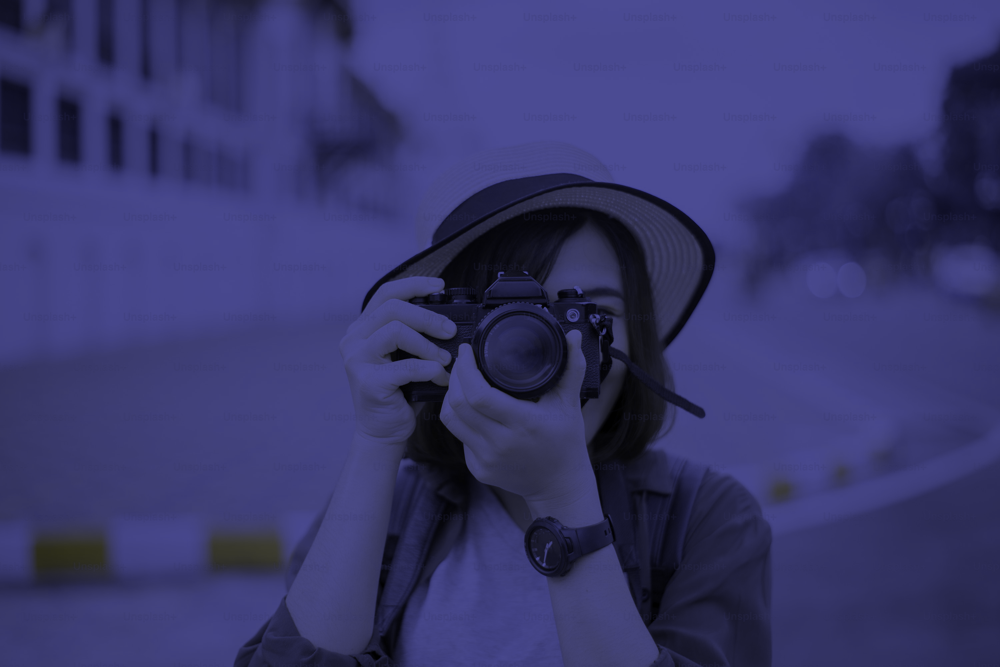

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Carregar as imagens dos canais R, G e B (substitua os caminhos pelos das suas imagens)
red_channel = cv2.imread('imagem_vermelho.jpg', cv2.IMREAD_GRAYSCALE)
green_channel = cv2.imread('imagem_verde.jpg', cv2.IMREAD_GRAYSCALE)
blue_channel = cv2.imread('imagem_azul.jpg', cv2.IMREAD_GRAYSCALE)

# Verifique se todas as imagens foram carregadas corretamente
if red_channel is None or green_channel is None or blue_channel is None:
    print("Erro ao carregar as imagens dos canais. Verifique os caminhos.")
else:
    # Combinar os três canais em uma imagem RGB
    merged_image = cv2.merge((green_channel, red_channel, red_channel))

    # Exibir a imagem combinada usando cv2_imshow()
    cv2_imshow(merged_image)

    # Salvar a imagem combinada se desejar
    cv2.imwrite('imagem_colorida.jpg', merged_image)
